In [ ]:
############################################################# INSTALLS ##########################################################

In [1]:
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 14.8 MB/s eta 0:00:00


In [ ]:
############################################################# IMPORTS ##########################################################

In [32]:
import numpy as np
import pandas as pd
import os
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from tensorflow import keras
from PIL import Image
from sklearn.model_selection import train_test_split
from skimage import exposure
from sklearn.metrics import accuracy_score
import visualkeras
import datetime
np.random.seed(42)
import seaborn as sns
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
print('TensoFlow Version: ', tf.__version__)
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models, layers
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, BatchNormalization, Dropout
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger
from matplotlib import style
style.use('fivethirtyeight')
%matplotlib inline

TensoFlow Version:  2.13.0


In [4]:
############################################################# DATA ##########################################################

In [2]:
from google.colab import drive
drive.mount('/content/drive')
rootDir='/content/ML/'
driveDir='/content/drive/MyDrive/ML/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
#!ls /content/drive/MyDrive/ML/data
#! unzip /content/drive/MyDrive/ML/data/archive.zip -d /content/ML/data

In [4]:
###################################DATA VISIUALIZATION ############################################

In [91]:
trainImgPath=rootDir+'data/Train'
train_df = pd.read_csv(rootDir+'data/Train.csv')
train_df.describe()


,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId
count,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000
mean,50.835880,50.328930,5.999515,5.962381,45.197302,44.728379,15.788390
std,24.306933,23.115423,1.475493,1.385440,23.060157,21.971145,12.013238
min,25.000000,25.000000,0.000000,5.000000,20.000000,20.000000,0.000000
25%,35.000000,35.000000,5.000000,5.000000,29.000000,30.000000,5.000000
50%,43.000000,43.000000,6.000000,6.000000,38.000000,38.000000,12.000000
75%,58.000000,58.000000,6.000000,6.000000,53.000000,52.000000,25.000000
max,243.000000,225.000000,20.000000,20.000000,223.000000,205.000000,42.000000


In [92]:
lables=pd.read_csv(rootDir+'data/labels.csv')
#lables.describe()
print("Total number of unique lables:",lables.count())
print(lables)
class_lables=lables["Name"]
class_lables=np.asarray(class_lables)

Total number of unique lables: ClassId    43
Name       43
dtype: int64
    ClassId                                               Name
0         0                               Speed limit (20km/h)
1         1                               Speed limit (30km/h)
2         2                               Speed limit (50km/h)
3         3                               Speed limit (60km/h)
4         4                               Speed limit (70km/h)
5         5                               Speed limit (80km/h)
6         6                        End of speed limit (80km/h)
7         7                              Speed limit (100km/h)
8         8                              Speed limit (120km/h)
9         9                                         No passing
10       10       No passing for vechiles over 3.5 metric tons
11       11              Right-of-way at the next intersection
12       12                                      Priority road
13       13                                   

In [93]:
################################# DATA CLEANING ################################

In [94]:

print("STEP 1: REMOVING THE UNWANTED COLUMNS")
train_df = train_df.drop(['Width', 'Height', 'Roi.X1', 'Roi.Y1', 'Roi.X2', 'Roi.Y2'], axis = 1)
print(train_df.head())
print("\nTotal Number of train Images : " ,train_df.count())

STEP 1: REMOVING THE UNWANTED COLUMNS
   ClassId                            Path
0       20  Train/20/00020_00000_00000.png
1       20  Train/20/00020_00000_00001.png
2       20  Train/20/00020_00000_00002.png
3       20  Train/20/00020_00000_00003.png
4       20  Train/20/00020_00000_00004.png

Total Number of train Images :  ClassId    39209
Path       39209
dtype: int64


In [95]:
NUM_CATEGORIES = len(os.listdir(trainImgPath))
NUM_CATEGORIES

43

In [96]:
######################################## DATA PREPROCESSING #######################################

Text(0, 0.5, 'Number of images')

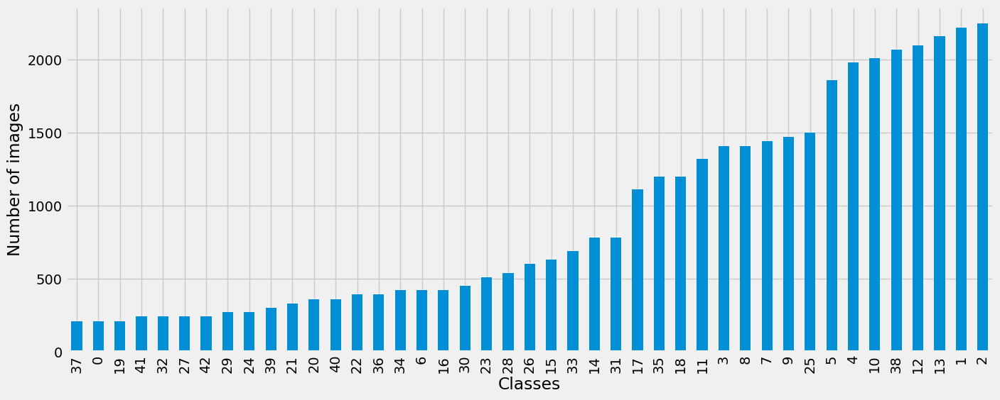

In [97]:
# number of images in each class
data_dic = {}
for folder in os.listdir(trainImgPath):
    data_dic[folder] = len(os.listdir(trainImgPath + '/' + folder))

data_df= pd.Series(data_dic)
plt.figure(figsize = (15, 6))
data_df.sort_values().plot(kind = 'bar')
plt.xlabel('Classes')
plt.ylabel('Number of images')


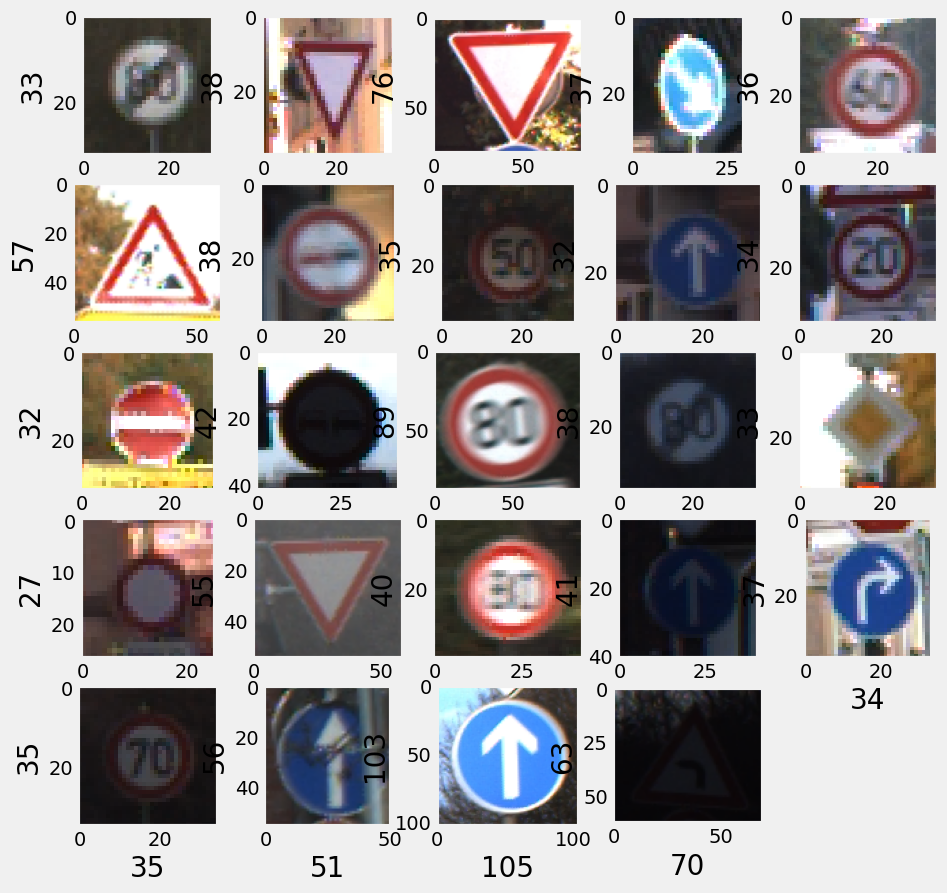

In [98]:
# Visualizing 25 random images from test data
import random
from matplotlib.image import imread

test = pd.read_csv(rootDir + 'data/Test.csv')
imgs = test["Path"].values

plt.figure(figsize=(10,10))

for i in range(1,25):
    plt.subplot(5,5,i)
    random_img_path = rootDir  + 'data/' + random.choice(imgs)
    rand_img = imread(random_img_path)
    plt.imshow(rand_img)
    plt.grid()
    plt.xlabel(rand_img.shape[1], fontsize = 20)#width of image
    plt.ylabel(rand_img.shape[0], fontsize = 20)#height of image

In [99]:
IMG_HEIGHT = 32
IMG_WIDTH = 32
channels = 3
image_data = []
image_labels = []

for i in range(NUM_CATEGORIES):
    path = rootDir + 'data/Train/' + str(i)
    images = os.listdir(path)

    for img in images:
        try:
            image = cv2.imread(path + '/' + img)
            #cv2_imshow(image)
            image_fromarray = Image.fromarray(image, 'RGB')
            resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
            image_data.append(np.array(resize_image))
            image_labels.append(i)
        except Exception as exc:
            print(exc)
            print("Error in " + img)

# Changing the list to numpy array
image_data = np.array(image_data)
image_labels = np.array(image_labels)

print(image_data.shape, image_labels.shape)

(39209, 32, 32, 3) (39209,)


In [100]:
shuffle_indexes = np.arange(image_data.shape[0])
np.random.shuffle(shuffle_indexes)
image_data = image_data[shuffle_indexes]
image_labels = image_labels[shuffle_indexes]

In [114]:
X_train, X_val1, y_train, y_val1 = train_test_split(image_data, image_labels, test_size=0.2, random_state=42, shuffle=True)
#print("X_valid.shape", X_val.shape,Y_val.shape)
X_val, X_test,y_val, y_test = train_test_split(X_val1,y_val1, test_size=0.4, shuffle=True)
#X_train = X_train/255
#X_val = X_val/255

print("X_train.shape", X_train.shape)
print("y_train.shape", y_train.shape)

print("X_valid.shape", X_val.shape)
print("y_valid.shape", y_val.shape)

print("X_test.shape", X_test.shape)
print("y_test.shape", y_test.shape)

X_train.shape (31367, 32, 32, 3)
y_train.shape (31367,)
X_valid.shape (4705, 32, 32, 3)
y_valid.shape (4705,)
X_test.shape (3137, 32, 32, 3)
y_test.shape (3137,)


In [115]:
y_train = keras.utils.to_categorical(y_train, NUM_CATEGORIES)
y_val_N=y_val
y_val = keras.utils.to_categorical(y_val, NUM_CATEGORIES)

print(y_train.shape)
print(y_val.shape)
#print(y_train[:5])

(31367, 43)
(4705, 43)


In [31]:
################################## BUILDING MODEL ###############################

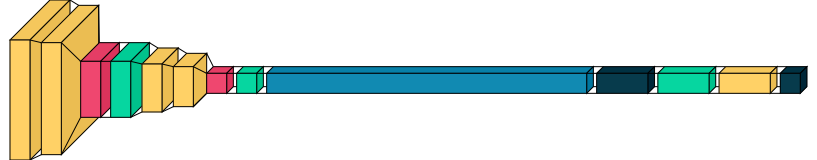

In [78]:
model = keras.models.Sequential([
    keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', input_shape=(IMG_HEIGHT,IMG_WIDTH,channels)),
    keras.layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.BatchNormalization(axis=-1),

    keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    keras.layers.Conv2D(filters=128, kernel_size=(3,3), activation='relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.BatchNormalization(axis=-1),

    keras.layers.Flatten(),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(rate=0.5),

    keras.layers.Dense(43, activation='softmax')
])
visualkeras.layered_view(model)



Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                            
                                                                 
 batch_normalization_6 (Bat  (None, 16, 16, 32)        128       
 chNormalization)                                                
                                                                 
 dropout_5 (Dropout)         (None, 16, 16, 32)        0         
                                                                 
 conv2d_9 (Conv2D)           (None, 16, 16, 128)       36992     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 8, 8, 128)        

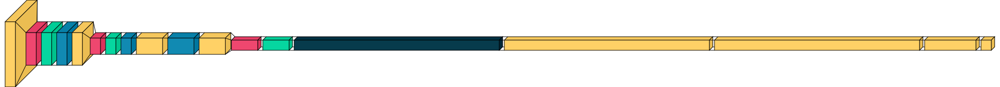

In [79]:
model = models.Sequential() #Sequential Model

#ConvLayer(64 filters) + MaxPooling + BatchNormalization + Dropout
model.add(layers.Conv2D(filters=32,kernel_size=3,activation='relu',padding='same',input_shape=(IMG_HEIGHT,IMG_WIDTH,channels)))
model.add(layers.MaxPool2D(strides=2))
model.add(layers.BatchNormalization())
model.add(layers.Dropout(0.3))

#ConvLayer(128 filters) + MaxPooling + BatchNormalization + Dropout
model.add(layers.Conv2D(filters=128,kernel_size=3,activation='relu',padding='same'))
model.add(layers.MaxPool2D(strides=2))
model.add(layers.BatchNormalization())
model.add(layers.Dropout(0.3))

#ConvLayer(512 filters) + Dropout + ConvLayer(512 filters) + MaxPooling + BatchNormalization
model.add(layers.Conv2D(filters=512,kernel_size=3,activation='relu',padding='same'))
model.add(layers.Dropout(0.3))
model.add(layers.Conv2D(filters=512,kernel_size=3,activation='relu',padding='same'))
model.add(layers.MaxPool2D(strides=2))
model.add(layers.BatchNormalization())

#Flatten
model.add(layers.Flatten())

#2 Dense layers with 4000 hidden units
model.add(layers.Dense(4000,activation='relu'))
model.add(layers.Dense(4000,activation='relu'))

#Dense layer with 1000 hidden units
model.add(layers.Dense(1000,activation='relu'))

#Softmax layer for output
model.add(layers.Dense(43,activation='softmax'))

model.summary()
visualkeras.layered_view(model)



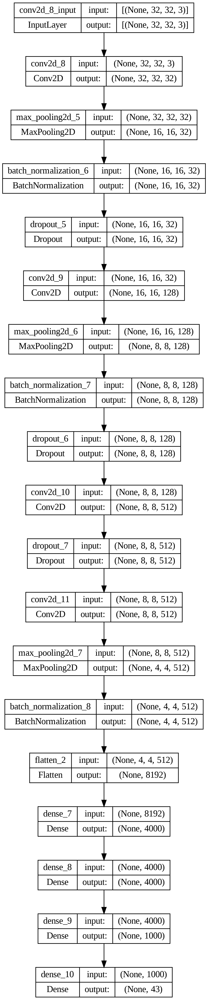

In [158]:
plot_model(model, show_layer_names=True, show_shapes =True, to_file=driveDir+'cnn_model.png', dpi=350)

In [81]:
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                            
                                                                 
 batch_normalization_6 (Bat  (None, 16, 16, 32)        128       
 chNormalization)                                                
                                                                 
 dropout_5 (Dropout)         (None, 16, 16, 32)        0         
                                                                 
 conv2d_9 (Conv2D)           (None, 16, 16, 128)       36992     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 8, 8, 128)        

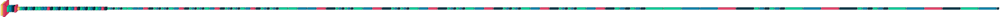

In [82]:
img_rows=32
img_cols=32
img_channels=3
resnet = ResNet50(weights= None, include_top=False, input_shape= (img_rows,img_cols,img_channels))
x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(NUM_CATEGORIES, activation= 'softmax')(x)
restNetModel = Model(inputs = resnet.input, outputs = predictions)
visualkeras.layered_view(restNetModel)

In [83]:
restNetModel.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 38, 38, 3)            0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 16, 16, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 16, 16, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [159]:
plot_model(restNetModel, show_layer_names=True, show_shapes =True, to_file=driveDir+'model1.png', dpi=350)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.478672 to fit



In [85]:
%load_ext tensorboard


!rm -rf ./cnnlogs/
!rm -rf ./resnetLogs/
log_dir = "cnnlogs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
resnet_log_dir = "resnetLogs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callbackCNN = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
tensorboard_callbackresNet = tf.keras.callbacks.TensorBoard(log_dir=resnet_log_dir, histogram_freq=1)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [86]:
cnn_csv_logger = CSVLogger('cnn_train_log.csv', separator=',')
resNet_csv_logger = CSVLogger('resnet_train_log.csv', separator=',')

In [87]:
lr = 0.001
epochs = 2
restNetModel.compile(loss='categorical_crossentropy',optimizer="adam",metrics=['accuracy'])
model.compile(loss='categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

In [88]:
################## MODEL TRAINING ####################

In [117]:
aug = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode="nearest")

epochs=10
cnnHistory=''
with tf.device('/GPU:0'):
  cnnHistory = model.fit(aug.flow(X_train, y_train, batch_size=32), epochs=epochs, validation_data=(X_val, y_val),callbacks = [cnn_csv_logger,tensorboard_callbackCNN])




Epoch 1/10
981/981 [==============================] - 21s 21ms/step - loss: 0.2045 - accuracy: 0.9317 - val_loss: 0.0921 - val_accuracy: 0.9658
Epoch 2/10
981/981 [==============================] - 20s 21ms/step - loss: 0.2110 - accuracy: 0.9314 - val_loss: 0.1012 - val_accuracy: 0.9626
Epoch 3/10
981/981 [==============================] - 20s 21ms/step - loss: 0.2527 - accuracy: 0.9204 - val_loss: 0.1069 - val_accuracy: 0.9654
Epoch 4/10
981/981 [==============================] - 20s 21ms/step - loss: 0.2099 - accuracy: 0.9310 - val_loss: 0.0793 - val_accuracy: 0.9741
Epoch 5/10
981/981 [==============================] - 20s 20ms/step - loss: 0.2641 - accuracy: 0.9182 - val_loss: 0.1058 - val_accuracy: 0.9639
Epoch 6/10
981/981 [==============================] - 20s 21ms/step - loss: 0.1920 - accuracy: 0.9368 - val_loss: 0.0878 - val_accuracy: 0.9730
Epoch 7/10
981/981 [==============================] - 20s 20ms/step - loss: 0.1900 - accuracy: 0.9387 - val_loss: 0.0737 - val_accuracy:

In [119]:
epochs=5
restNetModel
resHistory=''
with tf.device('/GPU:0'):
  resHistory = restNetModel.fit(X_train, y_train, batch_size=32, epochs=epochs, validation_data=(X_val, y_val),callbacks = [resNet_csv_logger,tensorboard_callbackresNet])



Epoch 1/5
981/981 [==============================] - 39s 40ms/step - loss: 0.3004 - accuracy: 0.9106 - val_loss: 0.1786 - val_accuracy: 0.9471
Epoch 2/5
981/981 [==============================] - 39s 40ms/step - loss: 0.2711 - accuracy: 0.9269 - val_loss: 0.1768 - val_accuracy: 0.9428
Epoch 3/5
981/981 [==============================] - 39s 40ms/step - loss: 0.2630 - accuracy: 0.9320 - val_loss: 0.3127 - val_accuracy: 0.8982
Epoch 4/5
981/981 [==============================] - 40s 40ms/step - loss: 0.4189 - accuracy: 0.9053 - val_loss: 0.2756 - val_accuracy: 0.9122
Epoch 5/5
981/981 [==============================] - 39s 40ms/step - loss: 0.2086 - accuracy: 0.9517 - val_loss: 0.1249 - val_accuracy: 0.9643


In [120]:
!fuser 6006/tcp -k
%tensorboard --logdir_spec=CNN:cnnlogs/fit,ResNet:resnetLogs/fit

<IPython.core.display.Javascript object>

In [ ]:
#################################### TEST the Model #################################

In [123]:
print("TESTING Accuracy CNN")
scores = model.evaluate(X_test, keras.utils.to_categorical(y_test, NUM_CATEGORIES))
print(f"Test Accuracy: {scores[1]*100}")

TESTING Accuracy CNN
99/99 [==============================] - 0s 3ms/step - loss: 1.0222 - accuracy: 0.9538
Test Accuracy: 95.37774920463562


In [125]:
print("TESTING Accuracy Restnet")
scores = restNetModel.evaluate(X_test, keras.utils.to_categorical(y_test, NUM_CATEGORIES))
print(f"Test Accuracy: {scores[1]*100}")

TESTING Accuracy Restnet
99/99 [==============================] - 1s 7ms/step - loss: 0.1137 - accuracy: 0.9653
Test Accuracy: 96.52534127235413


In [ ]:
################## Other Accuracy parameters ########################

In [160]:
pred = np.argmax(model.predict(X_test), axis = 1)
resPred= np.argmax(restNetModel.predict(X_test), axis = 1)
l=24
print(pred.shape,y_test.shape)
pred[l],y_test[l]

99/99 [==============================] - 2s 5ms/step
(3137,) (3137,)


(1, 1)

In [163]:
ls = [class_lables[i] for i in range(NUM_CATEGORIES)]
print("CNN MODEL")
print(classification_report(y_test, pred,target_names = ls))

CNN MODEL
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.80      0.95      0.87        21
                              Speed limit (30km/h)       0.99      0.93      0.96       188
                              Speed limit (50km/h)       0.92      0.98      0.95       150
                              Speed limit (60km/h)       0.97      0.97      0.97       104
                              Speed limit (70km/h)       0.97      0.99      0.98       153
                              Speed limit (80km/h)       0.97      0.97      0.97       158
                       End of speed limit (80km/h)       1.00      1.00      1.00        30
                             Speed limit (100km/h)       1.00      0.87      0.93       133
                             Speed limit (120km/h)       0.89      1.00      0.94       117
                                        No passing       1.00      1.

In [162]:
print("RESNET MODEL")
print(classification_report(y_test, resPred,target_names = ls))


RESNET MODEL
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.71      0.95      0.82        21
                              Speed limit (30km/h)       0.96      0.87      0.91       188
                              Speed limit (50km/h)       0.96      0.94      0.95       150
                              Speed limit (60km/h)       0.96      0.91      0.94       104
                              Speed limit (70km/h)       0.90      0.99      0.95       153
                              Speed limit (80km/h)       0.94      0.95      0.95       158
                       End of speed limit (80km/h)       1.00      0.97      0.98        30
                             Speed limit (100km/h)       0.97      0.97      0.97       133
                             Speed limit (120km/h)       0.92      0.94      0.93       117
                                        No passing       0.99     

CNN MODEL


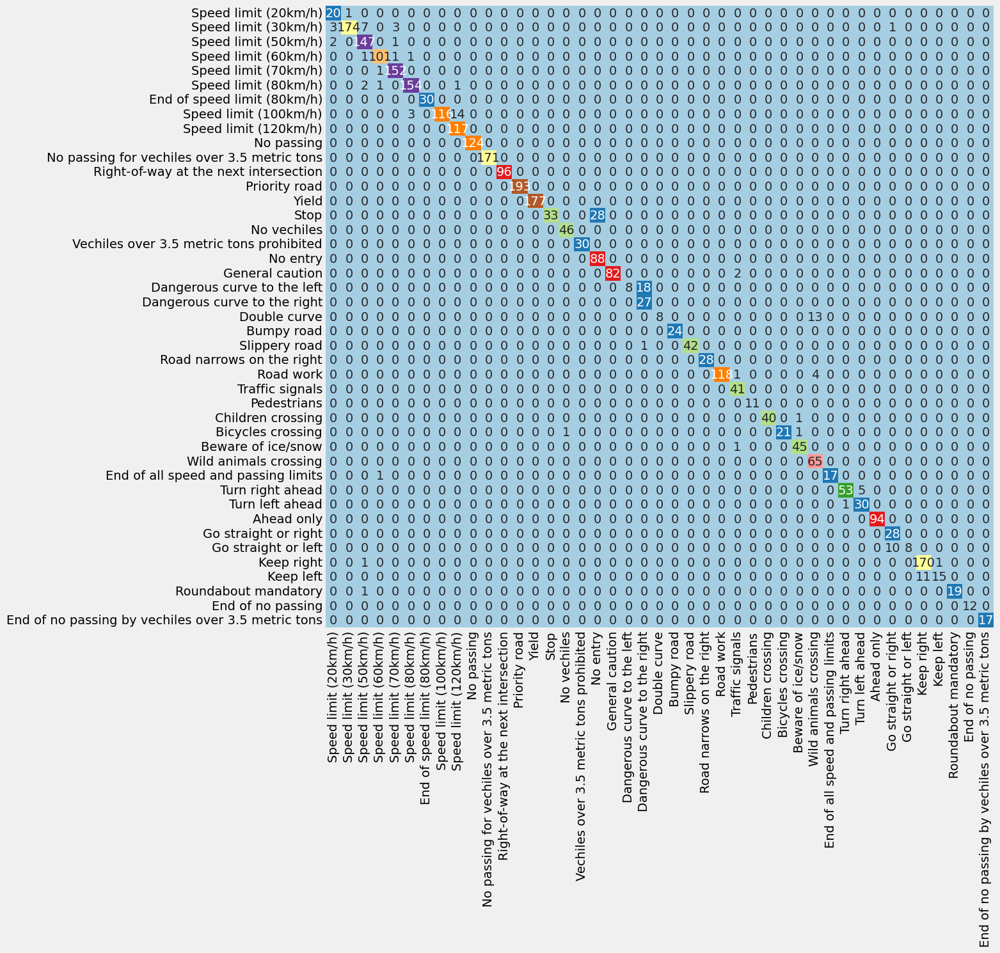

In [168]:
print("CNN MODEL")
cmat = confusion_matrix(y_test, pred)
plt.figure(figsize=(
    12,12))
sns.heatmap(cmat, annot = True, cbar = False, cmap='Paired', fmt="d", xticklabels=class_lables, yticklabels=class_lables);
plt.savefig(driveDir+'cnn_matrix.png')

RESNET MODEL


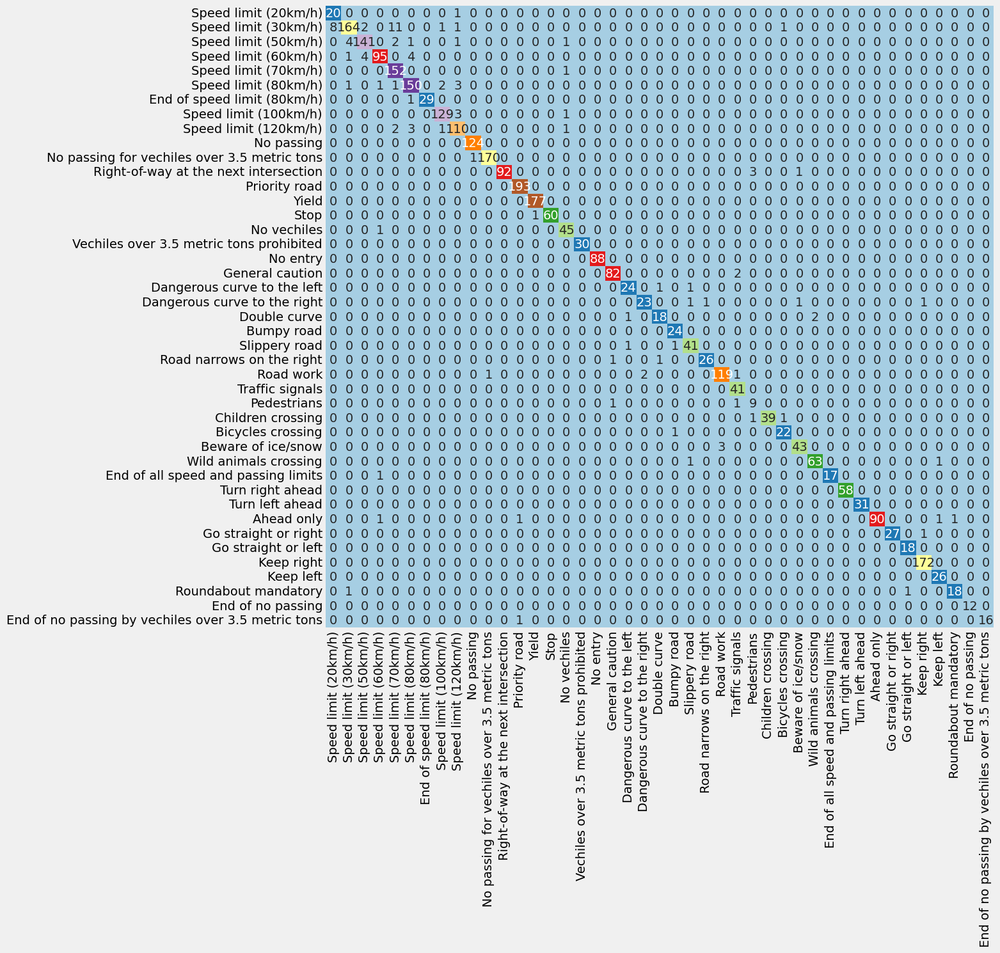

In [169]:
print("RESNET MODEL")
cmatRes = confusion_matrix(y_test, resPred)
plt.figure(figsize=(
    12,12))
sns.heatmap(cmatRes, annot = True, cbar = False, cmap='Paired', fmt="d", xticklabels=class_lables, yticklabels=class_lables);
plt.savefig(driveDir+'res_matrix.png')

In [172]:
classwise_acc = cmat.diagonal()/cmat.sum(axis=1) * 100

cls_acc = pd.DataFrame({'Class_Label':[i for i in range(43)], 'Accuracy': classwise_acc.tolist()}, columns = ['Class_Label', 'Accuracy'])

cls_acc.style.format({"Accuracy": "{:,.2f}",}).hide_index().bar(subset=["Accuracy"], color='tomato')

<ipython-input-172-e831674aefd2>:5: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  cls_acc.style.format({"Accuracy": "{:,.2f}",}).hide_index().bar(subset=["Accuracy"], color='tomato')


Class_Label,Accuracy
0,95.24
1,92.55
2,98.00
3,97.12
4,99.35
5,97.47
6,100.00
7,87.22
8,100.00
9,100.00


In [176]:
classwise_acc_res = cmatRes.diagonal()/cmatRes.sum(axis=1) * 100
cls_acc_res = pd.DataFrame({'Class_Label':[i for i in range(43)], 'Accuracy': classwise_acc_res.tolist()}, columns = ['Class_Label', 'Accuracy'])
cls_acc_res.style.format({"Accuracy": "{:,.2f}",}).hide_index().bar(subset=["Accuracy"], color='blue')

<ipython-input-176-cdd6c970ea6b>:3: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  cls_acc_res.style.format({"Accuracy": "{:,.2f}",}).hide_index().bar(subset=["Accuracy"], color='blue')


Class_Label,Accuracy
0,95.24
1,87.23
2,94.00
3,91.35
4,99.35
5,94.94
6,96.67
7,96.99
8,94.02
9,100.00


In [186]:
compareDf=pd.DataFrame(lables)
compareDf['Class_Label']=pd.DataFrame(cls_acc_res["Class_Label"])
compareDf['RESNET']=pd.DataFrame(cls_acc_res["Accuracy"])
compareDf['CNN']=pd.DataFrame(cls_acc["Accuracy"])
compareDf

,ClassId,Name,RESNET,CNN,Class_Label
0,0,Speed limit (20km/h),95.238095,95.238095,0
1,1,Speed limit (30km/h),87.234043,92.553191,1
2,2,Speed limit (50km/h),94.000000,98.000000,2
3,3,Speed limit (60km/h),91.346154,97.115385,3
4,4,Speed limit (70km/h),99.346405,99.346405,4
5,5,Speed limit (80km/h),94.936709,97.468354,5
6,6,End of speed limit (80km/h),96.666667,100.000000,6
7,7,Speed limit (100km/h),96.992481,87.218045,7
8,8,Speed limit (120km/h),94.017094,100.000000,8
9,9,No passing,100.000000,100.000000,9


In [ ]:
################################### SAVING THE MODEL #########################

In [157]:
cnnModelDir=driveDir+'model/'+'cnn_model_v2_4.h5'
model.save(cnnModelDir)

resNetModelDir=driveDir+'model/'+'resNet_model_v1_8.h5'
restNetModel.save(resNetModelDir)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
